# ENHANCING DARK IMAGES USING COMPUTER VISION


## Importing Libraries and mounting to drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import os
import random
import cv2

## Loading and displaying the Extremely Dark Data

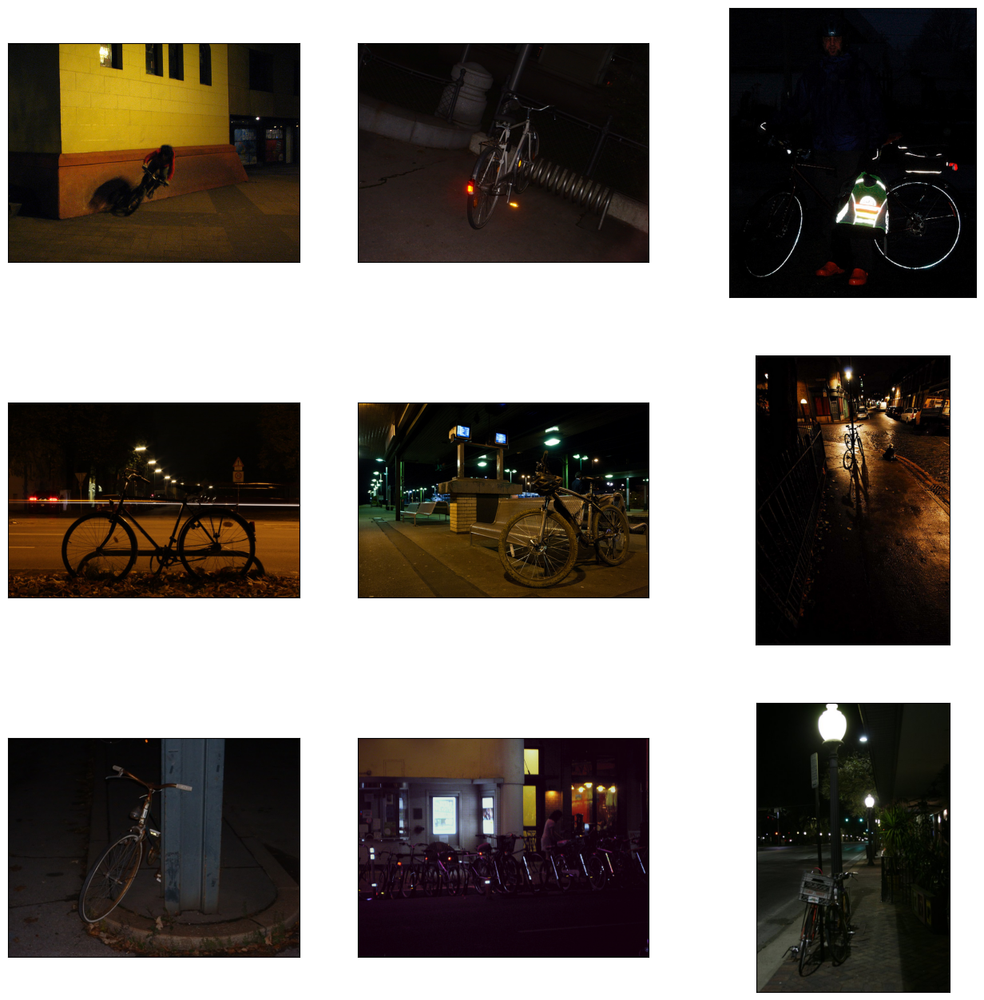

In [ ]:
def visualize_images(path, n_images, is_random=True, figsize=(16, 16)):
    plt.figure(figsize=figsize)
    w = int(n_images ** .5)
    h = math.ceil(n_images / w)

    all_names = os.listdir(path)
    image_names = all_names[:n_images]
    if is_random:
        random.seed(0)
        image_names = random.sample(all_names, n_images)

    for ind, image_name in enumerate(image_names):
        img = cv2.imread(os.path.join(path, image_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(h, w, ind + 1)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])

    plt.show()
visualize_images('/content/drive/MyDrive/ExDark/Bicycle', 9)

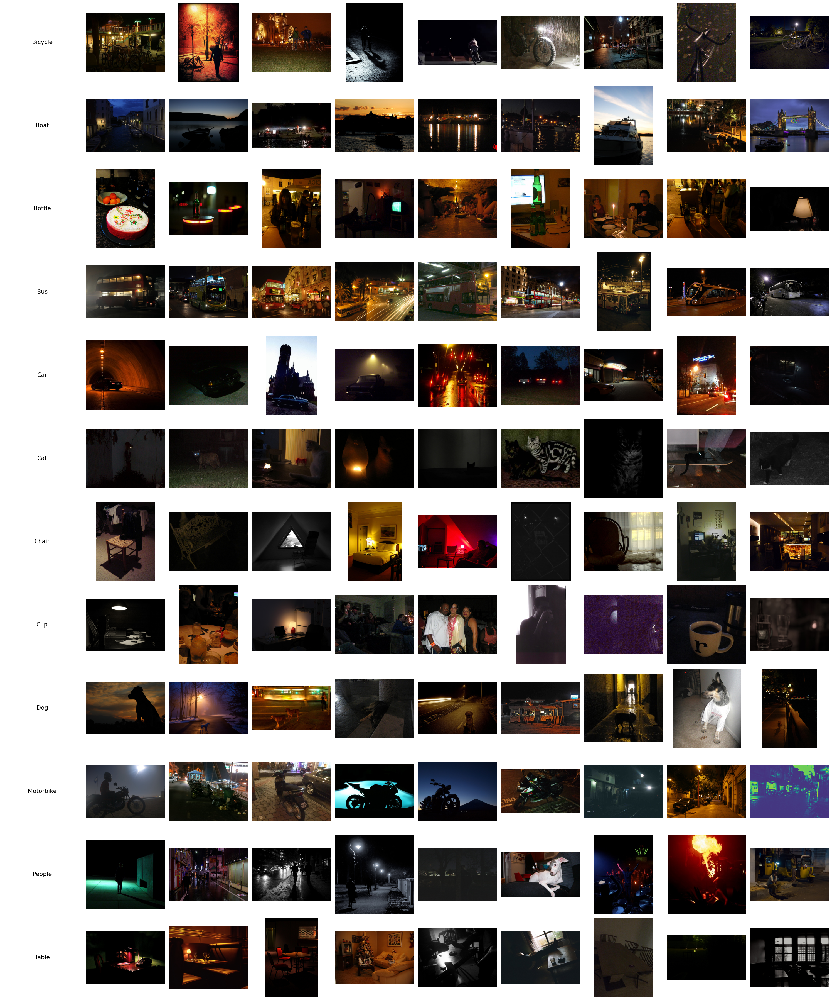

In [ ]:
import os
import matplotlib.pyplot as plt
from matplotlib.image import imread

def visualize_images(folders, num_images):
    total_images = num_images * len(folders)
    rows = len(folders)
    cols = num_images + 1  # +1 for the heading in each row

    fig = plt.figure(figsize=(cols * 3, rows * 3))

    for row, folder in enumerate(folders):
        image_files = os.listdir(folder)[:num_images]
        folder_name = os.path.basename(folder)

        # Adding folder name as the heading
        ax = fig.add_subplot(rows, cols, row * cols + 1)
        ax.text(0.5, 0.5, folder_name, horizontalalignment='center', verticalalignment='center', fontsize=15)
        ax.axis('off')

        for col, image_file in enumerate(image_files):
            img = imread(os.path.join(folder, image_file))
            ax = fig.add_subplot(rows, cols, row * cols + col + 2)
            ax.imshow(img)
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# List of folders to visualize images from
folders = [
    '/content/drive/MyDrive/ExDark/Bicycle',
    '/content/drive/MyDrive/ExDark/Boat',
    '/content/drive/MyDrive/ExDark/Bottle',
    '/content/drive/MyDrive/ExDark/Bus',
    '/content/drive/MyDrive/ExDark/Car',
    '/content/drive/MyDrive/ExDark/Cat',
    '/content/drive/MyDrive/ExDark/Chair',
    '/content/drive/MyDrive/ExDark/Cup',
    '/content/drive/MyDrive/ExDark/Dog',
    '/content/drive/MyDrive/ExDark/Motorbike',
    '/content/drive/MyDrive/ExDark/People',
    '/content/drive/MyDrive/ExDark/Table'
]

# Number of images to display from each folder
num_images = 9

visualize_images(folders, num_images)


## Data Inspection

In [7]:
import os
from PIL import Image
import numpy as np

# Function to calculate the average pixel intensity of an image
def is_dark_image(image, threshold=50):
    # Convert the image to grayscale
    grayscale_image = image.convert('L')
    # Calculate the average pixel intensity
    avg_intensity = np.mean(grayscale_image)
    # Check if the average intensity is below the threshold
    return avg_intensity < threshold

# Function to count dark images in each folder
def count_dark_images_in_folders(folders, target_size, threshold=50):
    dark_image_counts = {}
    for folder in folders:
        dark_count = 0
        image_files = os.listdir(folder)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('RGB')
            img = img.resize(target_size)  # Resize image to target size
            if is_dark_image(img, threshold):
                dark_count += 1
        dark_image_counts[os.path.basename(folder)] = dark_count
    return dark_image_counts

# Define the target size for resizing images
target_size = (64, 64)

# Count dark images in each folder
dark_image_counts = count_dark_images_in_folders(folders, target_size)

# Display the results
for folder, count in dark_image_counts.items():
    print(f'{folder}: {count} dark images')


Bicycle: 457 dark images
Boat: 373 dark images
Bottle: 432 dark images
Bus: 388 dark images
Car: 518 dark images
Cat: 615 dark images
Chair: 472 dark images
Cup: 374 dark images
Dog: 626 dark images
Motorbike: 365 dark images
People: 528 dark images
Table: 387 dark images


In [8]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Function to load images in batches
def load_images_in_batches(folders, batch_size, target_size):
    for label, folder in enumerate(folders):
        image_files = os.listdir(folder)
        for start in range(0, len(image_files), batch_size):
            images = []
            labels = []
            end = min(start + batch_size, len(image_files))
            for file in image_files[start:end]:
                img_path = os.path.join(folder, file)
                img = Image.open(img_path).convert('RGB')
                img = img.resize(target_size)  # Resize image here
                images.append(np.array(img))
                labels.append(label)
            yield np.array(images), np.array(labels)

# List of folders to visualize images from
folders = [
    '/content/drive/MyDrive/ExDark/Bicycle',
    '/content/drive/MyDrive/ExDark/Boat',
    '/content/drive/MyDrive/ExDark/Bottle',
    '/content/drive/MyDrive/ExDark/Bus',
    '/content/drive/MyDrive/ExDark/Car',
    '/content/drive/MyDrive/ExDark/Cat',
    '/content/drive/MyDrive/ExDark/Chair',
    '/content/drive/MyDrive/ExDark/Cup',
    '/content/drive/MyDrive/ExDark/Dog',
    '/content/drive/MyDrive/ExDark/Motorbike',
    '/content/drive/MyDrive/ExDark/People',
    '/content/drive/MyDrive/ExDark/Table'
]

# Define the target size for resizing images
target_size = (128, 128)

# Function to preprocess images
def preprocess_images(images):
    preprocessed_images = []
    for img in images:
        img = np.array(img) / 255.0  # Normalize pixel values
        preprocessed_images.append(img)
    return np.array(preprocessed_images)

# Process images in batches
batch_size = 100
all_images = []
all_labels = []
for images_batch, labels_batch in load_images_in_batches(folders, batch_size, target_size):
    preprocessed_images = preprocess_images(images_batch)
    all_images.append(preprocessed_images)
    all_labels.append(labels_batch)

all_images = np.vstack(all_images)
all_labels = np.hstack(all_labels)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(all_images, all_labels, test_size=0.2, random_state=42)

print(f'Training set size: {X_train.shape[0]}')
print(f'Testing set size: {X_test.shape[0]}')


Training set size: 5890
Testing set size: 1473


In [9]:
# Check Dataset Structure
def check_dataset_structure(folders):
    dataset_info = {}
    for folder in folders:
        num_images = len(os.listdir(folder))
        dataset_info[folder] = num_images
    return dataset_info

dataset_structure = check_dataset_structure(folders)
print("Dataset Structure:", dataset_structure)

Dataset Structure: {'/content/drive/MyDrive/ExDark/Bicycle': 652, '/content/drive/MyDrive/ExDark/Boat': 679, '/content/drive/MyDrive/ExDark/Bottle': 547, '/content/drive/MyDrive/ExDark/Bus': 527, '/content/drive/MyDrive/ExDark/Car': 638, '/content/drive/MyDrive/ExDark/Cat': 735, '/content/drive/MyDrive/ExDark/Chair': 648, '/content/drive/MyDrive/ExDark/Cup': 519, '/content/drive/MyDrive/ExDark/Dog': 801, '/content/drive/MyDrive/ExDark/Motorbike': 503, '/content/drive/MyDrive/ExDark/People': 609, '/content/drive/MyDrive/ExDark/Table': 505}


## Data Visualization

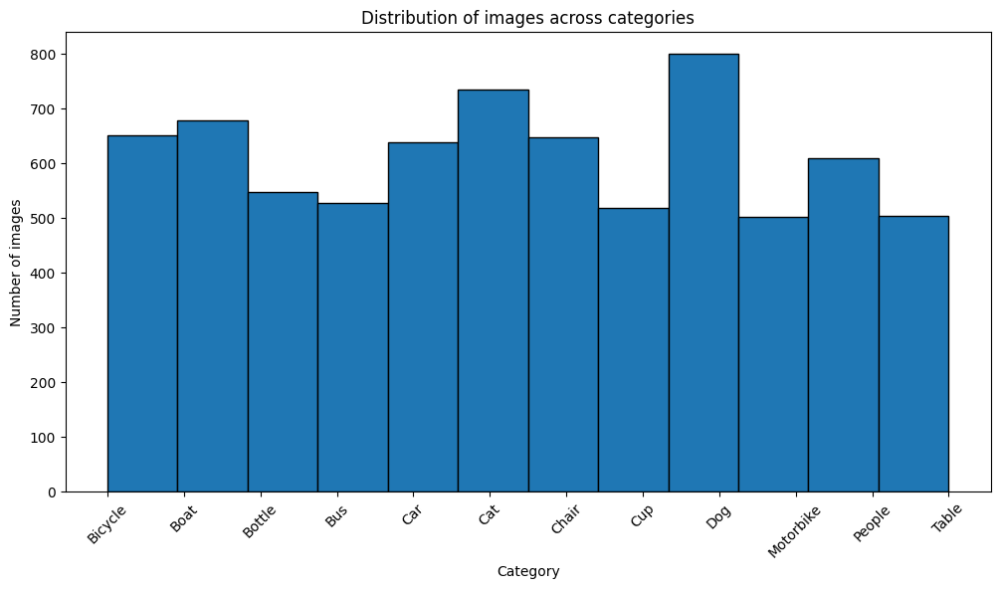

In [10]:
# Plot the distribution of images across categories
plt.figure(figsize=(12, 6))
plt.hist(all_labels, bins=len(folders), edgecolor='black')
plt.xticks(range(len(folders)), [os.path.basename(folder) for folder in folders], rotation=45)
plt.xlabel('Category')
plt.ylabel('Number of images')
plt.title('Distribution of images across categories')
plt.show()


In [ ]:
def check_missing_or_corrupted_images(folders):
    missing_or_corrupted = []
    for folder in folders:
        for file in os.listdir(folder):
            img_path = os.path.join(folder, file)
            try:
                img = cv2.imread(img_path)
                if img is None:
                    missing_or_corrupted.append(img_path)
            except:
                missing_or_corrupted.append(img_path)
    return missing_or_corrupted

missing_or_corrupted_images = check_missing_or_corrupted_images(folders)
print("Missing or Corrupted Images:", missing_or_corrupted_images)

Missing or Corrupted Images: []


In [11]:
def check_image_dimensions(folders):
    dimensions = []
    for folder in folders:
        for file in os.listdir(folder):
            img_path = os.path.join(folder, file)
            img = cv2.imread(img_path)
            dimensions.append(img.shape[:2])  # Height, Width
    return dimensions

image_dimensions = check_image_dimensions(folders)
print("Image Dimensions:", image_dimensions)

Image Dimensions: [(480, 640), (1014, 788), (375, 500), (490, 350), (168, 298), (2471, 3692), (337, 508), (500, 375), (683, 1024), (683, 1024), (811, 800), (398, 520), (1087, 734), (458, 640), (427, 640), (465, 900), (768, 1024), (360, 640), (338, 507), (640, 480), (428, 640), (800, 600), (730, 1095), (416, 412), (333, 500), (442, 640), (683, 1024), (363, 640), (640, 640), (480, 640), (356, 529), (1032, 774), (224, 400), (678, 1024), (360, 640), (534, 804), (424, 640), (640, 428), (3264, 2448), (333, 500), (678, 1024), (500, 426), (1200, 1600), (424, 640), (306, 306), (623, 1024), (628, 479), (427, 640), (478, 640), (513, 333), (428, 640), (306, 306), (450, 600), (426, 640), (400, 436), (683, 1024), (731, 1024), (480, 640), (1095, 730), (480, 854), (533, 800), (375, 500), (768, 1024), (480, 640), (425, 640), (480, 640), (500, 333), (602, 900), (672, 1024), (500, 332), (640, 480), (427, 640), (586, 900), (480, 640), (406, 599), (412, 620), (480, 640), (259, 515), (640, 427), (768, 1024)

## EXPLORATORY DATA ANALYSIS

In [12]:
def count_images_in_folders(folders):
    folder_names = []
    image_counts = []
    for folder in folders:
        folder_names.append(os.path.basename(folder))  # Get the folder name
        image_counts.append(len(os.listdir(folder)))  # Count images in the folder
    return folder_names, image_counts

# Function to plot the pie chart
def plot_image_distribution(folder_names, image_counts):
    plt.figure(figsize=(8, 8))
    plt.pie(image_counts, labels=folder_names, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.title('Distribution of Images Across Dataset Folders')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()

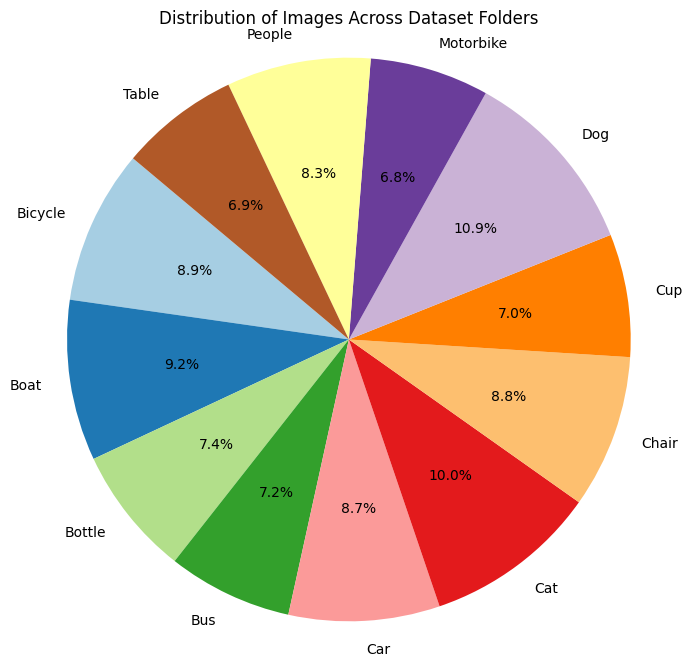

In [13]:
folder_names, image_counts = count_images_in_folders(folders)

# Plot the pie chart
plot_image_distribution(folder_names, image_counts)

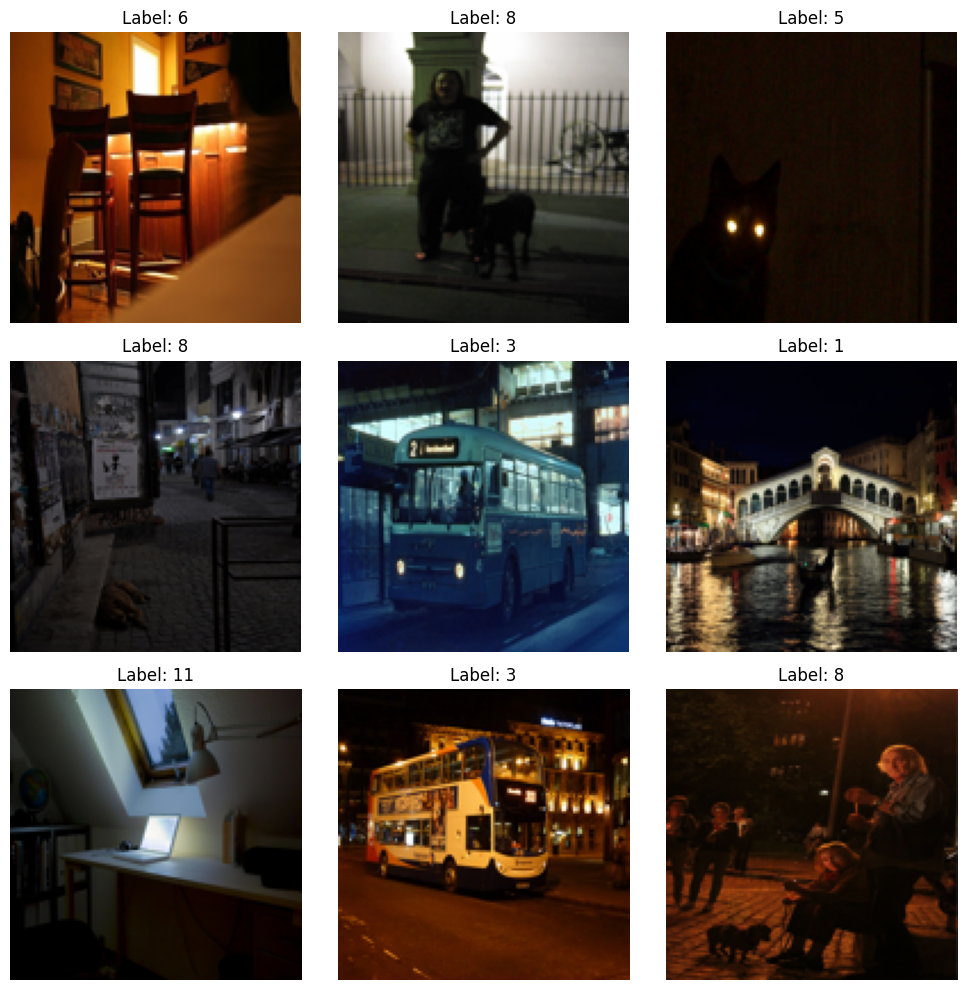

In [ ]:
# Display some preprocessed images from the training set
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(X_train[i])
    ax.axis('off')
    ax.set_title(f'Label: {y_train[i]}')
plt.tight_layout()
plt.show()

       Height   Width  Channels
count  7363.0  7363.0    7363.0
mean    128.0   128.0       3.0
std       0.0     0.0       0.0
min     128.0   128.0       3.0
25%     128.0   128.0       3.0
50%     128.0   128.0       3.0
75%     128.0   128.0       3.0
max     128.0   128.0       3.0


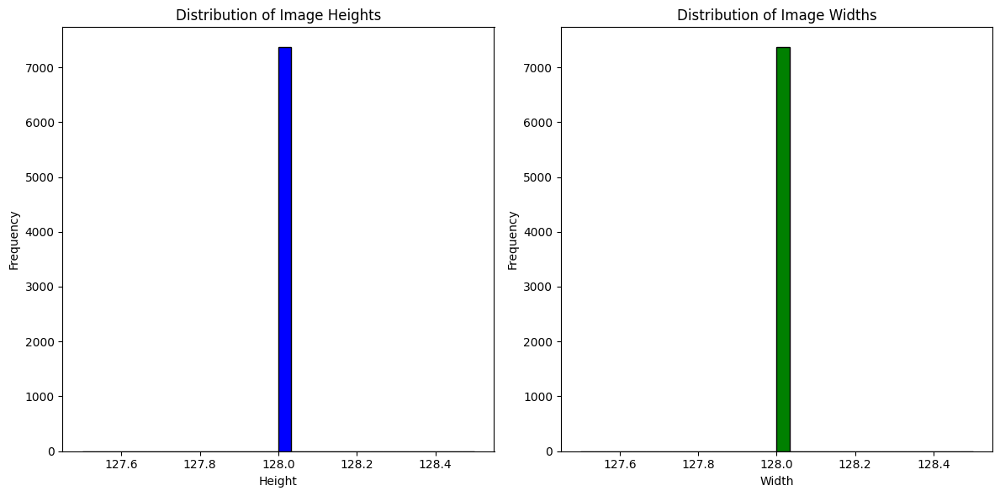

In [ ]:
import pandas as pd
import numpy as np
# Analyze image sizes
image_shapes = [img.shape for img in all_images]
image_shapes_df = pd.DataFrame(image_shapes, columns=['Height', 'Width', 'Channels'])

print(image_shapes_df.describe())

# Plot the distribution of image heights and widths
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(image_shapes_df['Height'], bins=30, color='blue', edgecolor='black')
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.title('Distribution of Image Heights')

plt.subplot(1, 2, 2)
plt.hist(image_shapes_df['Width'], bins=30, color='green', edgecolor='black')
plt.xlabel('Width')
plt.ylabel('Frequency')
plt.title('Distribution of Image Widths')

plt.tight_layout()
plt.show()


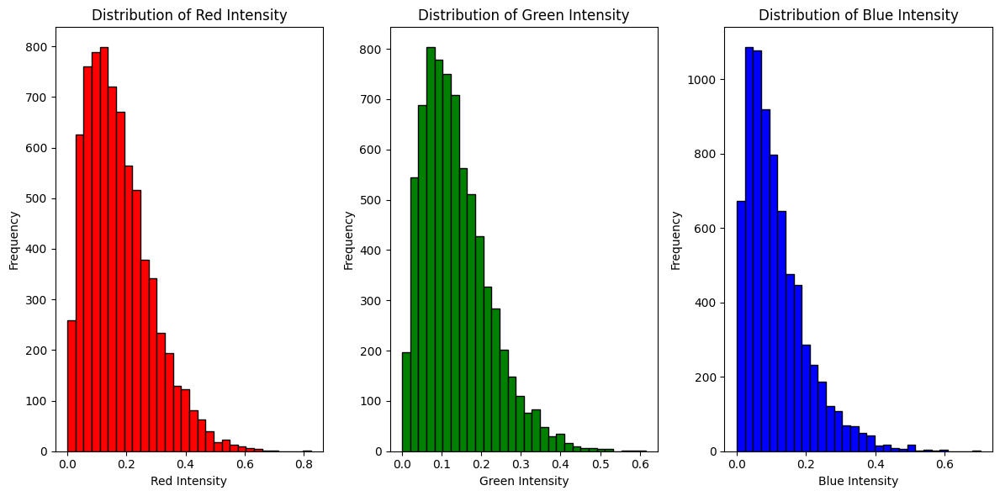

In [ ]:
# Analyze color distribution
def calculate_color_distribution(images):
    color_distribution = {'R': [], 'G': [], 'B': []}
    for img in images:
        R, G, B = img[:, :, 0], img[:, :, 1], img[:, :, 2]
        color_distribution['R'].append(np.mean(R))
        color_distribution['G'].append(np.mean(G))
        color_distribution['B'].append(np.mean(B))
    return color_distribution

color_distribution = calculate_color_distribution(all_images)

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.hist(color_distribution['R'], bins=30, color='red', edgecolor='black')
plt.xlabel('Red Intensity')
plt.ylabel('Frequency')
plt.title('Distribution of Red Intensity')

plt.subplot(1, 3, 2)
plt.hist(color_distribution['G'], bins=30, color='green', edgecolor='black')
plt.xlabel('Green Intensity')
plt.ylabel('Frequency')
plt.title('Distribution of Green Intensity')

plt.subplot(1, 3, 3)
plt.hist(color_distribution['B'], bins=30, color='blue', edgecolor='black')
plt.xlabel('Blue Intensity')
plt.ylabel('Frequency')
plt.title('Distribution of Blue Intensity')

plt.tight_layout()
plt.show()


In [ ]:
# Function to calculate pixel intensity distribution
def calculate_pixel_intensity_distribution(folders, target_size):
    all_pixel_values = []
    for folder in folders:
        image_files = os.listdir(folder)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img = img.resize(target_size)  # Resize image to target size
            pixel_values = np.array(img).flatten()
            all_pixel_values.extend(pixel_values)
    return np.array(all_pixel_values)


In [ ]:
def load_images_and_dimensions(folders):
    image_dimensions = []
    class_distribution = {os.path.basename(folder): 0 for folder in folders}
    for folder in folders:
        image_files = os.listdir(folder)
        class_distribution[os.path.basename(folder)] += len(image_files)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('RGB')
            image_dimensions.append(img.size)
    return image_dimensions, class_distribution

# Define the target size for resizing images
target_size = (64, 64)

# Load image dimensions and class distribution
image_dimensions, class_distribution = load_images_and_dimensions(folders)

# Calculate pixel intensity distribution
pixel_intensity_distribution = calculate_pixel_intensity_distribution(folders, target_size)

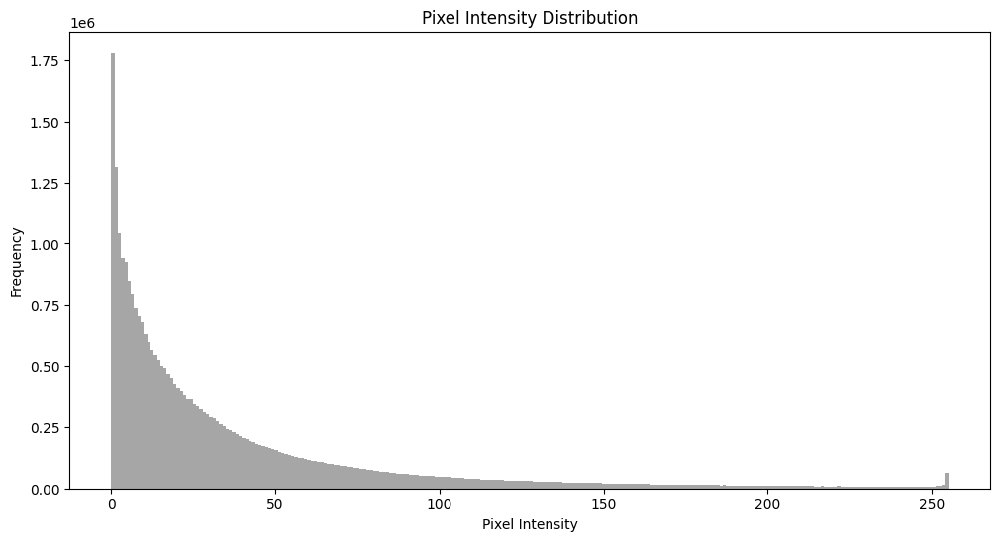

In [ ]:
# Plot pixel intensity distribution
plt.figure(figsize=(12, 6))
plt.hist(pixel_intensity_distribution, bins=256, range=(0, 255), color='gray', alpha=0.7)
plt.title('Pixel Intensity Distribution')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

Text(0, 0.5, 'Frequency')

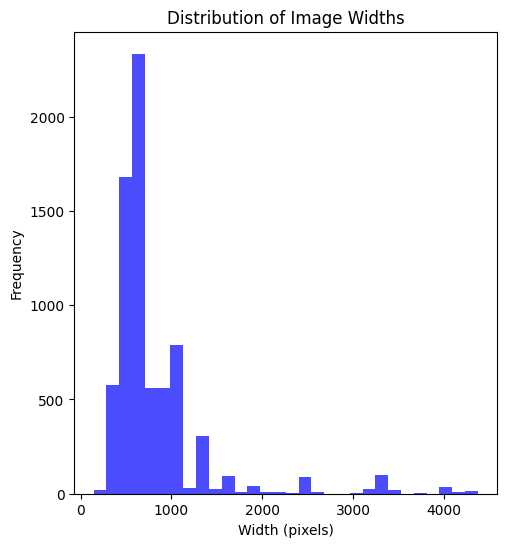

In [ ]:
# Plot distribution of image dimensions
widths, heights = zip(*image_dimensions)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=30, color='blue', alpha=0.7)
plt.title('Distribution of Image Widths')
plt.xlabel('Width (pixels)')
plt.ylabel('Frequency')

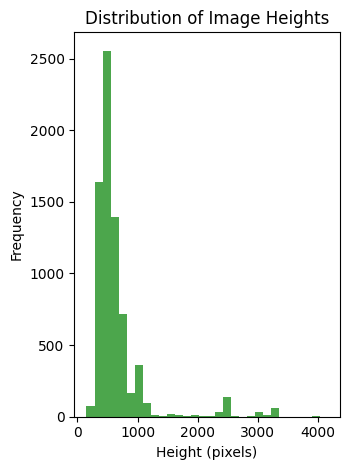

In [ ]:
plt.subplot(1, 2, 2)
plt.hist(heights, bins=30, color='green', alpha=0.7)
plt.title('Distribution of Image Heights')
plt.xlabel('Height (pixels)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [ ]:
# Function to load images and calculate average brightness
def calculate_average_brightness(folders):
    class_brightness = {os.path.basename(folder): [] for folder in folders}
    for folder in folders:
        image_files = os.listdir(folder)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            brightness = np.array(img).mean()
            class_brightness[os.path.basename(folder)].append(brightness)
    return class_brightness

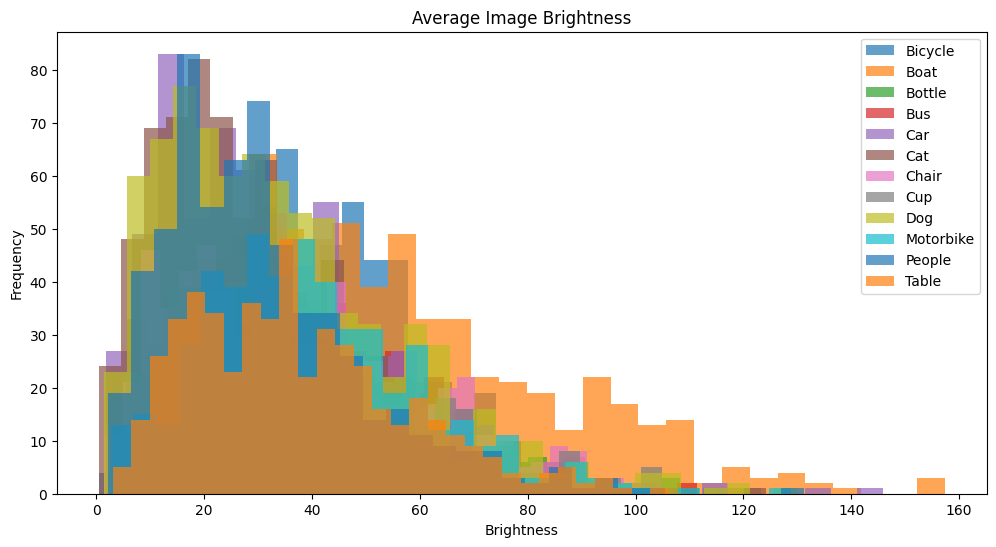

In [ ]:
# Calculate average brightness
class_brightness = calculate_average_brightness(folders)

# Average Brightness
plt.figure(figsize=(12, 6))
for folder, brightness in class_brightness.items():
    plt.hist(brightness, bins=30, alpha=0.7, label=folder)
plt.title('Average Image Brightness')
plt.xlabel('Brightness')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

In [ ]:
# Function to calculate aspect ratios
def calculate_aspect_ratios(image_dimensions):
    aspect_ratios = [w / h for w, h in image_dimensions]
    return aspect_ratios

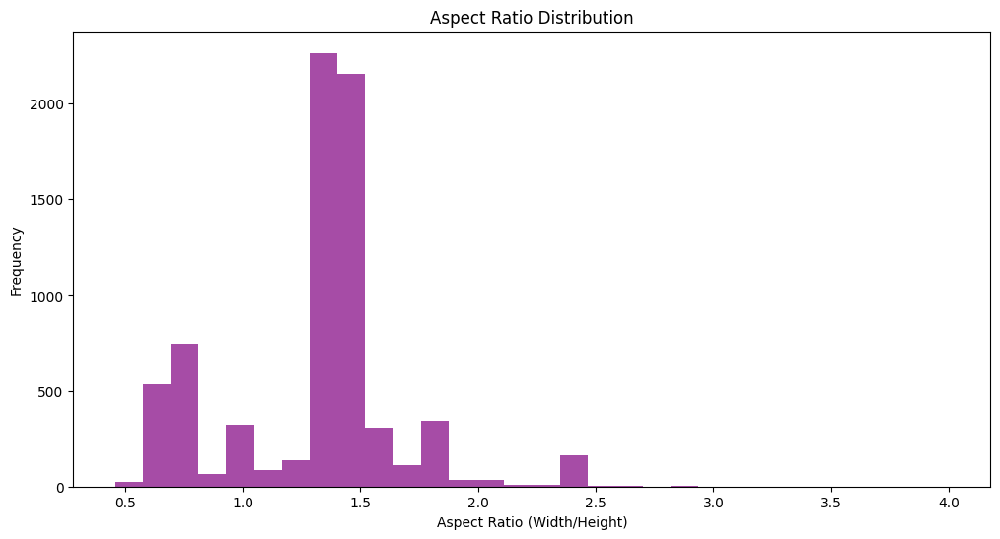

In [ ]:
# Calculate aspect ratios
aspect_ratios = calculate_aspect_ratios(image_dimensions)
# Aspect Ratio Distribution
plt.figure(figsize=(12, 6))
plt.hist(aspect_ratios, bins=30, color='purple', alpha=0.7)
plt.title('Aspect Ratio Distribution')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Function to calculate color channel distributions
def calculate_color_channel_distributions(folders, target_size):
    all_red_values, all_green_values, all_blue_values = [], [], []
    for folder in folders:
        image_files = os.listdir(folder)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('RGB')
            img = img.resize(target_size)
            r, g, b = img.split()
            all_red_values.extend(np.array(r).flatten())
            all_green_values.extend(np.array(g).flatten())
            all_blue_values.extend(np.array(b).flatten())
    return np.array(all_red_values), np.array(all_green_values), np.array(all_blue_values)

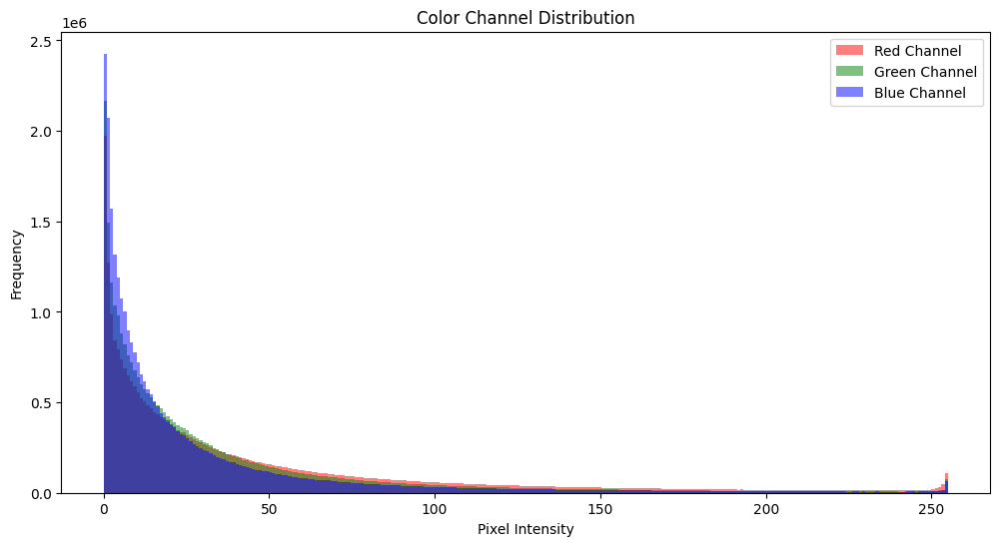

In [ ]:
# Calculate color channel distributions
red_distribution, green_distribution, blue_distribution = calculate_color_channel_distributions(folders, target_size)
# Color Channel Distribution
plt.figure(figsize=(12, 6))
plt.hist(red_distribution, bins=256, range=(0, 255), color='red', alpha=0.5, label='Red Channel')
plt.hist(green_distribution, bins=256, range=(0, 255), color='green', alpha=0.5, label='Green Channel')
plt.hist(blue_distribution, bins=256, range=(0, 255), color='blue', alpha=0.5, label='Blue Channel')
plt.title('Color Channel Distribution')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

In [ ]:
# Function to calculate image sizes
def calculate_image_sizes(image_dimensions):
    image_sizes = [w * h for w, h in image_dimensions]
    return image_sizes


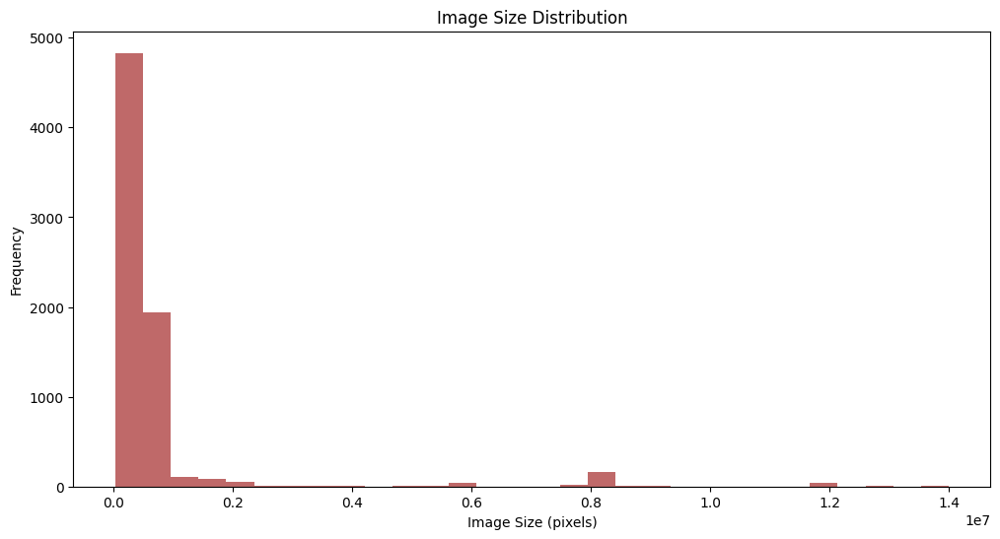

In [ ]:
# Calculate image sizes
image_sizes = calculate_image_sizes(image_dimensions)
# Image Size Distribution
plt.figure(figsize=(12, 6))
plt.hist(image_sizes, bins=30, color='brown', alpha=0.7)
plt.title('Image Size Distribution')
plt.xlabel('Image Size (pixels)')
plt.ylabel('Frequency')
plt.show()

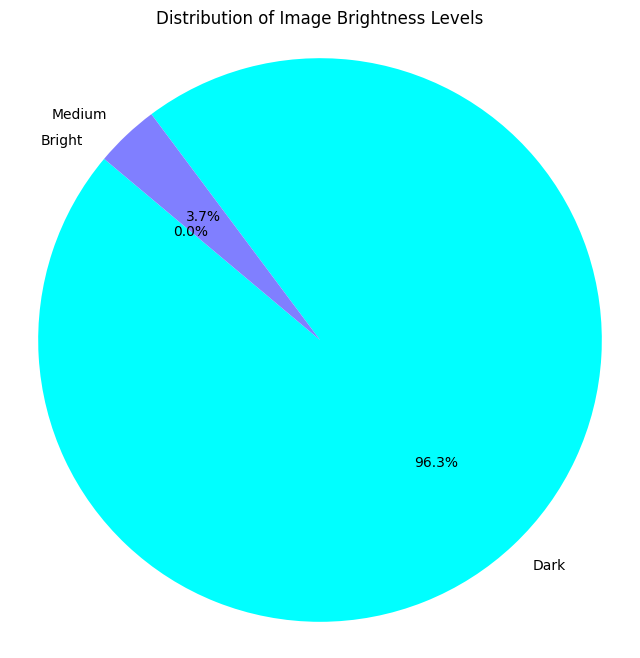

In [ ]:
# Function to calculate average brightness of an image
def calculate_brightness(image):
    return np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

# Function to classify brightness
def classify_brightness(brightness, thresholds=(85, 170)):
    if brightness < thresholds[0]:
        return 'Dark'
    elif brightness < thresholds[1]:
        return 'Medium'
    else:
        return 'Bright'

# Classify all images in a folder
def classify_images_by_brightness(folders):
    brightness_classes = {'Dark': 0, 'Medium': 0, 'Bright': 0}
    for folder in folders:
        for file in os.listdir(folder):
            img_path = os.path.join(folder, file)
            img = cv2.imread(img_path)
            brightness = calculate_brightness(img)
            category = classify_brightness(brightness)
            brightness_classes[category] += 1
    return brightness_classes

# Function to plot brightness distribution
def plot_brightness_distribution(brightness_classes):
    plt.figure(figsize=(8, 8))

    # Get the colors from the colormap
    colors = plt.cm.cool(np.linspace(0, 1, len(brightness_classes)))

    plt.pie(brightness_classes.values(), labels=brightness_classes.keys(), autopct='%1.1f%%', startangle=140, colors=colors)
    plt.title('Distribution of Image Brightness Levels')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()
# Call the function with the defined data
brightness_classes = classify_images_by_brightness(folders)
plot_brightness_distribution(brightness_classes)


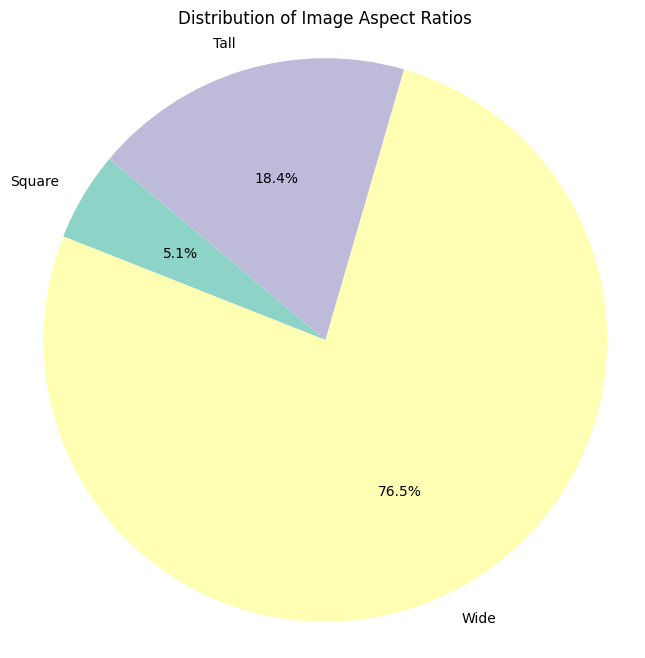

In [ ]:
def classify_images_by_aspect_ratio(folders):
    aspect_ratios = {'Square': 0, 'Wide': 0, 'Tall': 0}
    for folder in folders:
        for file in os.listdir(folder):
            img_path = os.path.join(folder, file)
            img = cv2.imread(img_path)
            h, w, _ = img.shape
            ratio = w / h
            if 0.9 < ratio < 1.1:
                aspect_ratios['Square'] += 1
            elif ratio >= 1.1:
                aspect_ratios['Wide'] += 1
            else:
                aspect_ratios['Tall'] += 1
    return aspect_ratios

# Plot the pie chart
def plot_aspect_ratio_distribution(aspect_ratios):
    plt.figure(figsize=(8, 8))
    plt.pie(aspect_ratios.values(), labels=aspect_ratios.keys(), autopct='%1.1f%%', startangle=140, colors=plt.cm.Set3.colors)
    plt.title('Distribution of Image Aspect Ratios')
    plt.axis('equal')
    plt.show()

aspect_ratios = classify_images_by_aspect_ratio(folders)
plot_aspect_ratio_distribution(aspect_ratios)

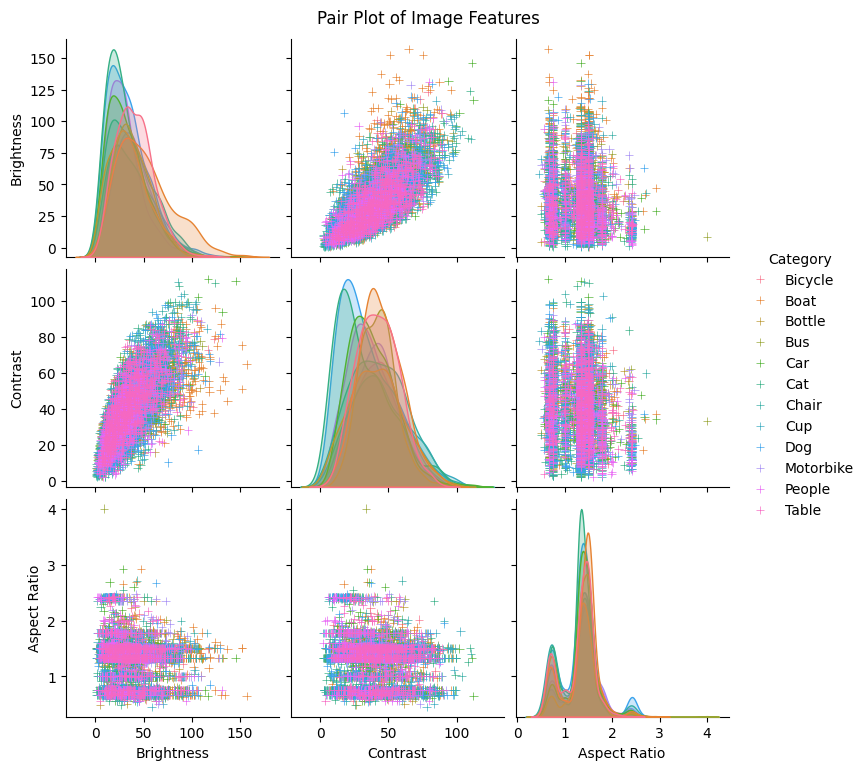

In [ ]:
import cv2
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt

# Function to calculate average brightness of an image
def calculate_brightness(image):
    return np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

# Function to calculate contrast of an image
def calculate_contrast(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray.std()

# Function to calculate aspect ratio of an image
def calculate_aspect_ratio(image):
    h, w = image.shape[:2]
    return w / h

# Function to extract features from images in folders
def extract_image_features(folders):
    features = []
    labels = []
    for folder in folders:
        for file in os.listdir(folder):
            img_path = os.path.join(folder, file)
            img = cv2.imread(img_path)
            if img is not None:  # Ensure the image was read correctly
                brightness = calculate_brightness(img)
                contrast = calculate_contrast(img)
                aspect_ratio = calculate_aspect_ratio(img)
                features.append([brightness, contrast, aspect_ratio])
                labels.append(os.path.basename(folder))  # Use folder name as label
    return np.array(features), np.array(labels)

features, labels = extract_image_features(folders)
df = pd.DataFrame(features, columns=['Brightness', 'Contrast', 'Aspect Ratio'])
df['Category'] = labels

# Plotting the pair plot
sns.pairplot(df, hue='Category', diag_kind='kde', markers='+')
plt.suptitle('Pair Plot of Image Features', y=1.02)
plt.show()


In [14]:
# Function to find the most frequent images
def find_most_frequent_images(folders, target_size, top_n=5):
    image_hashes = {}
    for folder in folders:
        image_files = os.listdir(folder)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('RGB')
            img = img.resize(target_size)
            img_hash = hash(img.tobytes())
            if img_hash in image_hashes:
                image_hashes[img_hash] += 1
            else:
                image_hashes[img_hash] = 1
    most_frequent_images = sorted(image_hashes.items(), key=lambda x: x[1], reverse=True)[:top_n]
    return most_frequent_images

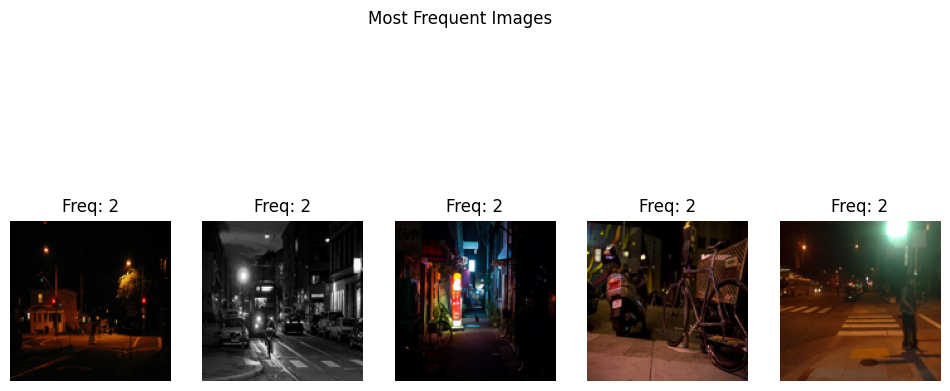

In [15]:
most_frequent_images = find_most_frequent_images(folders, target_size)

plt.figure(figsize=(12, 6))
for i, (img_hash, freq) in enumerate(most_frequent_images):
    plt.subplot(1, len(most_frequent_images), i + 1)
    for folder in folders:
        image_files = os.listdir(folder)
        for file in image_files:
            img_path = os.path.join(folder, file)
            img = Image.open(img_path).convert('RGB')
            img = img.resize(target_size)
            if hash(img.tobytes()) == img_hash:
                plt.imshow(img)
                plt.title(f'Freq: {freq}')
                plt.axis('off')
                break
plt.suptitle('Most Frequent Images')
plt.show()

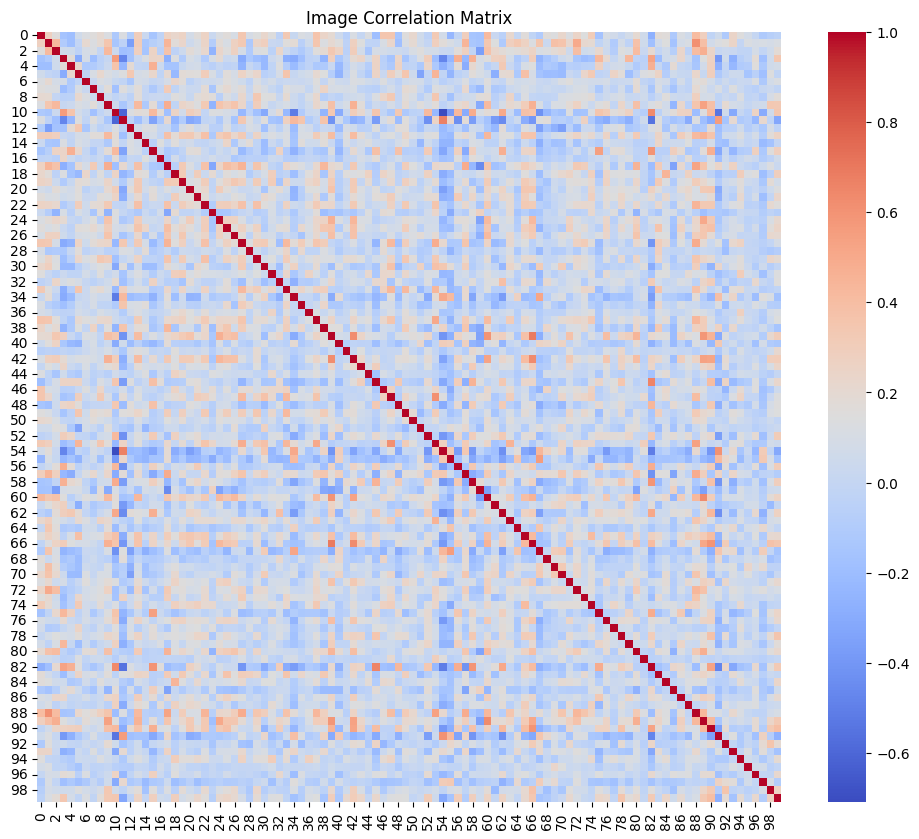

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
# Image Correlation Matrix
subset_images = all_images[:100]
flattened_images = subset_images.reshape(subset_images.shape[0], -1)
correlation_matrix = np.corrcoef(flattened_images)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Image Correlation Matrix')
plt.show()

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

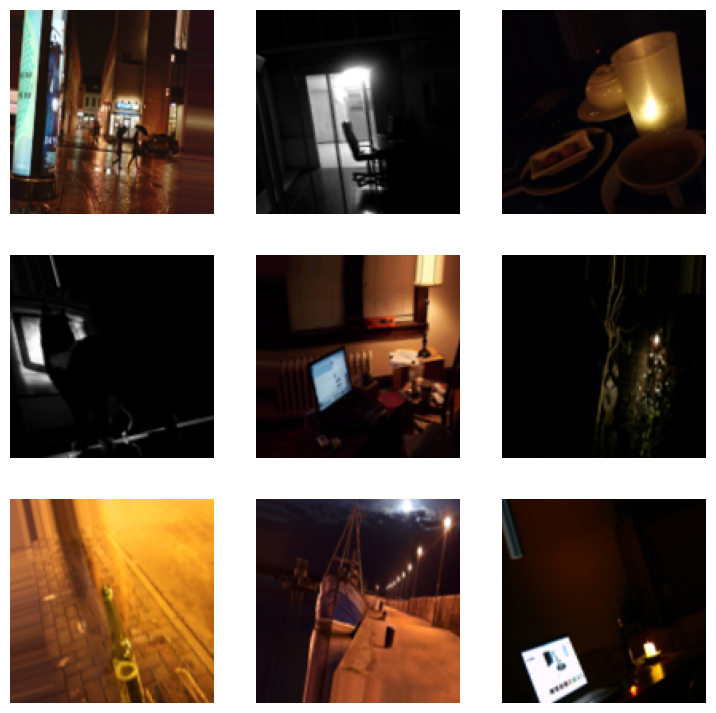

In [18]:
# Display a few augmented images
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9):
    plt.figure(figsize=(9, 9))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(X_batch[i])
        plt.axis('off')
    plt.show()
    break  # We only need to visualize one batch of augmented images

## COMPUTER VISION - Histogram Equalization

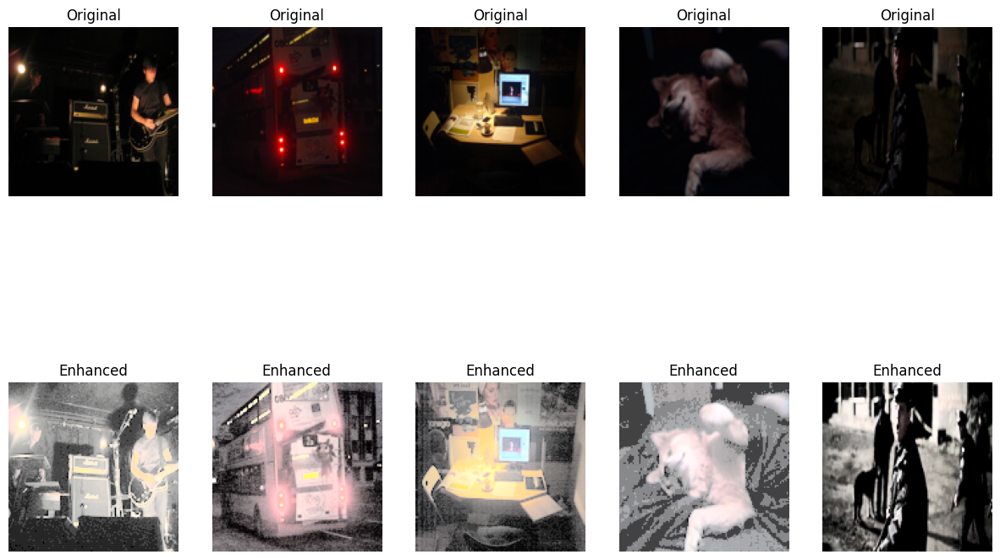

In [19]:
import cv2
import matplotlib.pyplot as plt

# Function to apply histogram equalization
def histogram_equalization(img):
    img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    return img_output

# Enhance some test images
enhanced_images = np.array([histogram_equalization((img * 255).astype(np.uint8)) for img in X_test])

# Visualize original vs enhanced images
def visualize_enhanced_images(original, enhanced, num_images=5):
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        plt.subplot(2, num_images, i + 1)
        plt.imshow(original[i])
        plt.title('Original')
        plt.axis('off')

        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(enhanced[i])
        plt.title('Enhanced')
        plt.axis('off')
    plt.show()

visualize_enhanced_images(X_test, enhanced_images)
